# Important Libraries

In [1]:
import os
import glob
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import multiprocessing
import tensorflow as tf
import tensorflow_probability as tfp
from PIL import Image
import cv2
import random
import imgaug.augmenters as iaa
from joblib import Parallel, delayed
from multiprocessing import Pool, cpu_count

os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'

# Limit the number of threads used by TensorFlow
tf.config.threading.set_inter_op_parallelism_threads(4)
tf.config.threading.set_intra_op_parallelism_threads(4)

# Functions

In [131]:
# Function to load and process an image (for use with parallel processing)
def load_and_process_image(args):
    subdir_path, label, filename = args
    img_path = os.path.join(subdir_path, filename)
    
    if not os.path.exists(img_path):
        print(f"File not found: {img_path}")
        return None
    
    try:
        img = tf.io.read_file(img_path)
        img = tf.image.decode_image(img, channels=3)  # Read image as color
        img = tf.image.resize(img, [256, 256])  # Example resizing
        img = tf.image.convert_image_dtype(img, tf.float32)  # Normalize to [0, 1]
        if img is not None:
            return img.numpy(), label
    except Exception as e:
        print(f"Error processing file {img_path}: {e}")
    return None

In [3]:
# Function to load and process an image, including its dimensions
def load_and_process_image_dimension(args):
    subdir_path, label, filename = args
    img_path = os.path.join(subdir_path, filename)
    
    if not os.path.exists(img_path):
        print(f"File not found: {img_path}")
        return None
    
    try:
        img = tf.io.read_file(img_path)
        img = tf.image.decode_image(img, channels=1)  # Read image as grayscale
        img_shape = tf.shape(img)
        width, height = img_shape[1].numpy(), img_shape[0].numpy()
        img = tf.image.resize(img, [256, 256])  # Example resizing
        img = tf.image.convert_image_dtype(img, tf.float32)  # Normalize to [0, 1]
        return img.numpy(), label, width, height
    except Exception as e:
        print(f"Error processing file {img_path}: {e}")
        return None

In [4]:
# Function to load and preprocess an image (for use with OpenCV)
def load_and_preprocess_image(image_path):
    try:
        img = tf.io.read_file(image_path)
        img = tf.image.decode_image(img, channels=3)  # Read image as RGB
        img = tf.image.resize(img, [256, 256])  # Resize image for consistency
        img = tf.image.convert_image_dtype(img, tf.float32)  # Normalize to [0, 1]
        return img
    except Exception as e:
        print(f"Error processing file {image_path}: {e}")
        return None

In [5]:
# Function to convert a TensorFlow image to an OpenCV image
def tf_to_cv2_image(tf_image):
    return np.array(tf_image * 255, dtype=np.uint8)

In [6]:
# Function to enhance the contrast of an image using histogram equalization
def enhance_contrast(image):
    yuv_img = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
    yuv_img[:,:,0] = cv2.equalizeHist(yuv_img[:,:,0])
    return cv2.cvtColor(yuv_img, cv2.COLOR_YUV2RGB)

In [8]:
# Function to apply a color filter to an image (e.g., for green colors)
def color_filtering(image):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lower_green = np.array([35, 40, 40])
    upper_green = np.array([85, 255, 255])
    mask = cv2.inRange(hsv_image, lower_green, upper_green)
    filtered_image = cv2.bitwise_and(image, image, mask=mask)
    return filtered_image

In [11]:
# Function to create batches from an iterable
def batch(iterable, n=1):
    """Yield successive n-sized chunks from iterable."""
    l = len(iterable)
    for ndx in range(0, l, n):
        yield iterable[ndx:min(ndx + n, l)]

In [135]:
# Function to load images and labels from a folder, using parallel processing
def load_images_from_folder(folder_path, sample_size=100, n_jobs=-1, batch_size=1000):
    images_labels = []
    for subdir in os.listdir(folder_path):
        subdir_path = os.path.join(folder_path, subdir)
        if os.path.isdir(subdir_path):
            label = subdir  # Folder name is used as the label
            filenames = os.listdir(subdir_path)
            if len(filenames) > sample_size:
                sampled_filenames = np.random.choice(filenames, sample_size, replace=False)
            else:
                sampled_filenames = filenames

            # Process images in batches
            for file_batch in batch(sampled_filenames, batch_size):
                args = [(subdir_path, label, filename) for filename in file_batch]
                results = Parallel(n_jobs=n_jobs)(delayed(load_and_process_image)(arg) for arg in args)
                images_labels.extend([result for result in results if result is not None])
    
    images, labels = zip(*images_labels) if images_labels else ([], [])
    return list(images), list(labels)

In [13]:
# Function to load images, labels, and dimensions from a folder, using parallel processing
def load_images_from_folder_dimension(folder_path, sample_size=100, n_jobs=-1, batch_size=1000):
    images_labels_dims = []
    for subdir in os.listdir(folder_path):
        subdir_path = os.path.join(folder_path, subdir)
        if os.path.isdir(subdir_path):
            label = subdir  # Folder name is used as the label
            filenames = os.listdir(subdir_path)
            if len(filenames) > sample_size:
                sampled_filenames = np.random.choice(filenames, sample_size, replace=False)
            else:
                sampled_filenames = filenames

            # Process images in batches
            for file_batch in batch(sampled_filenames, batch_size):
                args = [(subdir_path, label, filename) for filename in file_batch]
                results = Parallel(n_jobs=n_jobs)(delayed(load_and_process_image_dimension)(arg) for arg in args)
                images_labels_dims.extend([result for result in results if result is not None])
    
    # Debugging: Print the structure of images_labels_dims
    # print(f"Loaded {len(images_labels_dims)} image(s).")
    # for item in images_labels_dims[:5]:  # Print first 5 items
    #     print(item)
    
    # Ensure that all elements have four values
    images_labels_dims = [item for item in images_labels_dims if item and len(item) == 4]
    
    if images_labels_dims:
        images, labels, widths, heights = zip(*images_labels_dims)
        return list(images), list(labels), list(widths), list(heights)
    else:
        return [], [], [], []

In [14]:
# Function to count files in each subdirectory of a parent directory
def count_files_in_subdirectories(parent_dir):
    # Dictionary to store the count of files in each subdirectory
    file_counts = {}
    
    # Iterate over each subdirectory
    for subdir in os.listdir(parent_dir):
        subdir_path = os.path.join(parent_dir, subdir)
        if os.path.isdir(subdir_path):
            # Count files in the subdirectory
            file_count = len(glob.glob(os.path.join(subdir_path, '*')))
            file_counts[subdir] = file_count
    
    return file_counts

In [153]:
# Function to calculate various statistics (mean, median, std, min, max) for a list of images
def calculate_statistics(images, labels, n_jobs=-1):
    def calculate_stats(img, label):
        img_tensor = tf.convert_to_tensor(img, dtype=tf.float32)
        mean_intensity = tf.reduce_mean(img_tensor).numpy()
        median_intensity = tfp.stats.percentile(img_tensor, 50.0).numpy()  # Requires tfp (TensorFlow Probability)
        std_intensity = tf.math.reduce_std(img_tensor).numpy()
        min_intensity = tf.reduce_min(img_tensor).numpy()
        max_intensity = tf.reduce_max(img_tensor).numpy()
        return {
            'label': label,
            'mean_intensity': mean_intensity,
            'median_intensity': median_intensity,
            'std_intensity': std_intensity,
            'min_intensity': min_intensity,
            'max_intensity': max_intensity
        }

    stats = Parallel(n_jobs=n_jobs)(delayed(calculate_stats)(img, label) for img, label in zip(images, labels))
    return pd.DataFrame(stats)

In [16]:
# Function to apply advanced augmentations to an image using imgaug
def advanced_augmentations(image):
    aug = iaa.Sequential([
        iaa.SomeOf((1, 5), [
            iaa.Affine(scale=(0.5, 1.5), rotate=(-45, 45)),
            iaa.PerspectiveTransform(scale=(0.01, 0.15)),
            iaa.MotionBlur(k=5),
            iaa.AdditiveGaussianNoise(scale=(10, 60)),
            iaa.JpegCompression(compression=(70, 99)),
            iaa.Dropout(p=(0, 0.1)),
            iaa.Solarize(0.2),
            iaa.AddToHueAndSaturation((-50, 50)),
            iaa.PiecewiseAffine(scale=(0.01, 0.05))
        ], random_order=True)
    ])
    return aug(image=image)

In [17]:
# Function to visualize statistics using boxplots
def visualize_statistics(stats_df):
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='label', y='mean_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Mean Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.boxplot(x='label', y='std_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Standard Deviation of Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.boxplot(x='label', y='median_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Median Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.boxplot(x='label', y='min_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Minimum Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.boxplot(x='label', y='max_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Maximum Pixel Intensity by Plant-Disease Category')
    plt.show()

In [20]:
# Function to visualize statistics using violin plots
def plot_violin(stats_df):
    plt.figure(figsize=(12, 8))
    sns.violinplot(x='label', y='mean_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Mean Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.violinplot(x='label', y='std_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Standard Deviation of Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.violinplot(x='label', y='median_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Median Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.violinplot(x='label', y='min_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Minimum Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.violinplot(x='label', y='max_intensity', data=stats_df)
    plt.xticks(rotation=90)
    plt.title('Maximum Pixel Intensity by Plant-Disease Category')
    plt.show()

In [21]:
# Function to visualize statistics using scatter plots
def plot_scatter(stats_df):
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x='mean_intensity', y='std_intensity', hue='label', data=stats_df)
    plt.title('Mean vs. Standard Deviation of Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.scatterplot(x='mean_intensity', y='median_intensity', hue='label', data=stats_df)
    plt.title('Mean vs. Median Pixel Intensity by Plant-Disease Category')
    plt.show()

    plt.figure(figsize=(12, 8))
    sns.scatterplot(x='min_intensity', y='max_intensity', hue='label', data=stats_df)
    plt.title('Min vs. Max Pixel Intensity by Plant-Disease Category')
    plt.show()

In [22]:
# Function to show the pixel distribution for each label using histograms and parallel multiprocessing
def show_pixel_distribution(images, labels, cols=4, n_jobs=-1):
    unique_labels = sorted(list(set(labels)))  # Sort the labels
    num_labels = len(unique_labels)
    rows = (num_labels + cols - 1) // cols  # Calculate number of rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()  # Flatten the array of axes for easy iteration

    def process_label_images(label):
        label_images = [img for img, lbl in zip(images, labels) if lbl == label]
        all_pixel_values = np.concatenate([img.ravel() for img in label_images])
        return label, all_pixel_values

    # Use parallel processing to compute pixel values for each label
    results = Parallel(n_jobs=n_jobs)(delayed(process_label_images)(label) for label in unique_labels)

    for ax, (label, all_pixel_values) in zip(axes, results):
        sns.histplot(all_pixel_values, bins=256, ax=ax, kde=True)
        ax.set_title(f'{label}')
        ax.set_xlabel('Pixel Intensity')
        ax.set_ylabel('Frequency')
        ax.grid(True)

    # Remove any empty subplots
    for i in range(num_labels, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

In [23]:
# Function to plot the correlation matrix of the image statistics
def plot_correlation_matrix(stats_df):
    corr_matrix = stats_df.drop(columns=['label']).corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Correlation Matrix of Image Statistics')
    plt.show()

In [24]:
# Function to create pair plots of the image statistics
def plot_pairplot(dataframe, hue):
    plt.figure(figsize=(12, 8))
    sns.pairplot(dataframe, hue=hue)
    plt.title('Pair Plot of Features')
    plt.show()

In [25]:
# Function to plot the dimensions (width and height) of images
def plot_image_dimensions(widths, heights):
    df = pd.DataFrame({'Width': widths, 'Height': heights})
    
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x='Width', y='Height', data=df, alpha=0.6)
    plt.title('Scatter Plot of Image Dimensions')
    plt.xlabel('Width (pixels)')
    plt.ylabel('Height (pixels)')
    plt.grid(True)
    plt.show()

In [26]:
# Function to plot histograms of pixel intensities for each label
def plot_histograms(images, labels, num_bins=256, cols=4):
    unique_labels = sorted(list(set(labels)))  # Sort the labels
    num_labels = len(unique_labels)
    rows = (num_labels + cols - 1) // cols  # Calculate number of rows needed
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()  # Flatten the array of axes for easy iteration

    for ax, label in zip(axes, unique_labels):
        label_images = [img for img, lbl in zip(images, labels) if lbl == label]
        all_pixel_values = np.concatenate([img.ravel() for img in label_images])
        ax.hist(all_pixel_values, bins=num_bins, alpha=0.75, color='blue')
        ax.set_title(f'{label}')
        ax.set_xlabel('Pixel Intensity')
        ax.set_ylabel('Frequency')
        ax.grid(True)
    
    # Remove any empty subplots
    for i in range(num_labels, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

In [97]:
# Function to plot the color distribution of images and their segmented counterparts
def plot_color_distribution_with_sample(images, low_threshold=10, high_threshold=245):
    num_boxes = len(images) // 4
    plt.figure(figsize=(20, num_boxes * 4))

    for idx, (img, folder_name, img_type) in enumerate(images):
        imgg = img
        img = img - tf.reduce_min(img)
        img = img / tf.reduce_max(img)
        img_np = img.numpy()
        imgg_np = imgg.numpy()
        img_np_uint8 = (img_np * 255).astype(np.uint8)  # Convert to uint8 for proper sample output
        imgg_np_uint8 = (imgg_np * 255).astype(np.uint8) # Convert to uint8 for proper histogram calculation

        r, g, b = cv2.split(imgg_np_uint8)  # Split the channels correctly in RGB order

        # Apply thresholds to remove near pure black and overly bright pixels
        mask = (r >= low_threshold) & (r <= high_threshold) & \
               (g >= low_threshold) & (g <= high_threshold) & \
               (b >= low_threshold) & (b <= high_threshold)

        r = r[mask]
        g = g[mask]
        b = b[mask]

        # Determine the position in the plot
        box_idx = idx // 4
        sub_idx = idx % 4
        row_offset = box_idx * 2
        col_offset = sub_idx % 2

        # Plot the sample image
        plt.subplot(num_boxes * 2, 4, 4 * row_offset + 1 + col_offset * 2 + (sub_idx // 2) * 4)
        plt.imshow(img_np_uint8)
        plt.title(f'{img_type} Image {box_idx + 1}\n{folder_name}', fontsize=8)
        plt.axis('off')

        # Plot the color distribution
        plt.subplot(num_boxes * 2, 4, 4 * row_offset + 2 + col_offset * 2 + (sub_idx // 2) * 4)
        hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])
        hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
        hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
        plt.plot(hist_r, color='red', label='Red')
        plt.plot(hist_g, color='green', label='Green')
        plt.plot(hist_b, color='blue', label='Blue')
        plt.title(f'{img_type} Color Distribution {box_idx + 1}', fontsize=8)
        plt.xlabel('Pixel Intensity', fontsize=8)
        plt.ylabel('Frequency', fontsize=8)
        plt.legend(fontsize=8)
        plt.grid(True)

    plt.tight_layout()
    plt.show()

In [75]:
# Function to find species that have both healthy and ill folders
def find_species_with_healthy_and_ill_folders(base_path):
    species_dict = {}
    
    for folder in os.listdir(base_path):
        if '___' in folder:
            species, condition = folder.split('___', 1)
            if species not in species_dict:
                species_dict[species] = {'healthy': [], 'ill': []}
            
            if 'healthy' in condition.lower():
                species_dict[species]['healthy'].append(folder)
            else:
                species_dict[species]['ill'].append(folder)
    
    return {species: subfolders for species, subfolders in species_dict.items() if subfolders['healthy'] and subfolders['ill']}

In [84]:
# Function to compare color and segmented samples for a given number of species
def compare_color_and_segmented_samples(color_path, segmented_path, num_samples=5):
    species_dict = find_species_with_healthy_and_ill_folders(color_path)
    if not species_dict:
        print("No species with both healthy and ill folders found.")
        return
    
    selected_species = random.sample(list(species_dict.keys()), num_samples)
    comparison_images = []
    
    for species in selected_species:
        healthy_folders = species_dict[species]['healthy']
        ill_folders = species_dict[species]['ill']
        
        # Randomly select one healthy and one ill folder
        healthy_folder = random.choice(healthy_folders)
        ill_folder = random.choice(ill_folders)
        
        # Get random healthy sample
        healthy_folder_path = os.path.join(color_path, healthy_folder)
        healthy_files = os.listdir(healthy_folder_path)
        healthy_file = random.choice(healthy_files)
        healthy_color_image_path = os.path.join(healthy_folder_path, healthy_file)
        
        healthy_base_name = os.path.splitext(healthy_file)[0]
        healthy_segmented_folder = os.path.join(segmented_path, healthy_folder)
        healthy_segmented_file_path = None
        for ext in ['.jpg', '.jpeg', '.png', '.bmp']:
            potential_path = os.path.join(healthy_segmented_folder, healthy_base_name + '_final_masked' + ext)
            if os.path.exists(potential_path):
                healthy_segmented_file_path = potential_path
                break
        
        if healthy_segmented_file_path:
            healthy_color_image = load_and_preprocess_image(healthy_color_image_path)
            healthy_segmented_image = load_and_preprocess_image(healthy_segmented_file_path)
            if healthy_color_image is not None and healthy_segmented_image is not None:
                comparison_images.append((healthy_color_image, healthy_folder, 'Healthy Color'))
                comparison_images.append((healthy_segmented_image, healthy_folder, 'Healthy Segmented'))
        
        # Get random ill sample
        ill_folder_path = os.path.join(color_path, ill_folder)
        ill_files = os.listdir(ill_folder_path)
        ill_file = random.choice(ill_files)
        ill_color_image_path = os.path.join(ill_folder_path, ill_file)
        
        ill_base_name = os.path.splitext(ill_file)[0]
        ill_segmented_folder = os.path.join(segmented_path, ill_folder)
        ill_segmented_file_path = None
        for ext in ['.jpg', '.jpeg', '.png', '.bmp']:
            potential_path = os.path.join(ill_segmented_folder, ill_base_name + '_final_masked' + ext)
            if os.path.exists(potential_path):
                ill_segmented_file_path = potential_path
                break
        
        if ill_segmented_file_path:
            ill_color_image = load_and_preprocess_image(ill_color_image_path)
            ill_segmented_image = load_and_preprocess_image(ill_segmented_file_path)
            if ill_color_image is not None and ill_segmented_image is not None:
                comparison_images.append((ill_color_image, ill_folder, 'Ill Color'))
                comparison_images.append((ill_segmented_image, ill_folder, 'Ill Segmented'))
    
    if comparison_images:
        plot_color_distribution_with_sample(comparison_images)
    else:
        print("No valid image pairs found.")

In [155]:
# Function to aggregate classes into healthy and diseased categories
def aggregate_classes(df):
    # Define a mapping for healthy and diseased classes
    healthy_labels = [
        "Apple___healthy", "Blueberry___healthy", "Cherry_(including_sour)___healthy",
        "Corn_(maize)___healthy", "Grape___healthy", "Orange___healthy",
        "Peach___healthy", "Pepper,_bell___healthy", "Potato___healthy",
        "Raspberry___healthy", "Soybean___healthy", "Squash___healthy",
        "Strawberry___healthy", "Tomato___healthy"
    ]
    df['health_status'] = df['label'].apply(lambda x: 'healthy' if x in healthy_labels else 'diseased')
    return df

In [159]:
# Function to extract species from the label
def extract_species(df):
    # Extract species name from label
    df['species'] = df['label'].apply(lambda x: x.split('___')[0])
    return df

# Results

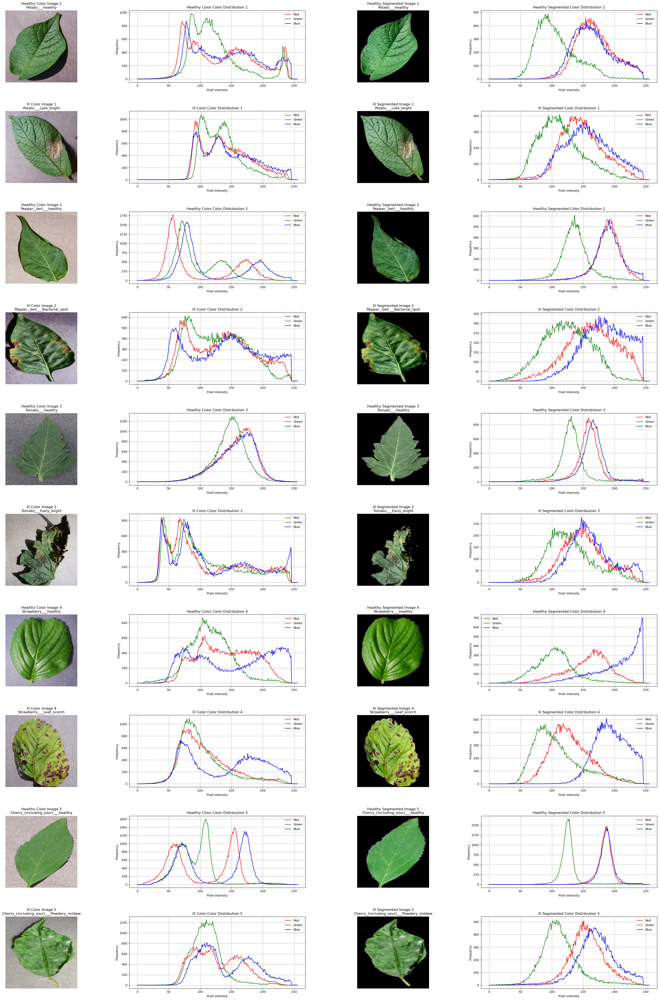

In [117]:
color_dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/color'
segmented_dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/segmented'

# Compare and plot the samples
compare_color_and_segmented_samples(color_dataset_path, segmented_dataset_path)

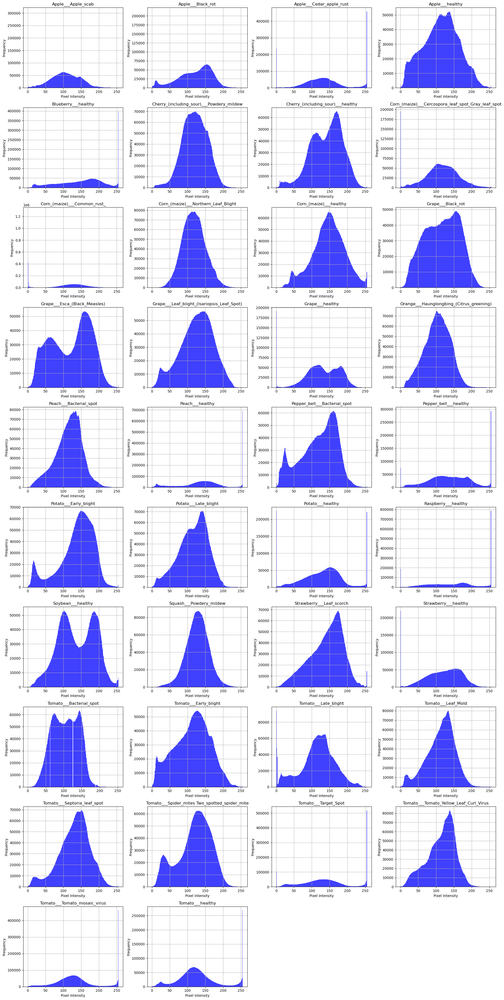

In [ ]:
# Directory containing the dataset
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'

# Load images and labels using parallel processing
images, labels = load_images_from_folder(dataset_path)

# Plot histograms
plot_histograms(images, labels)

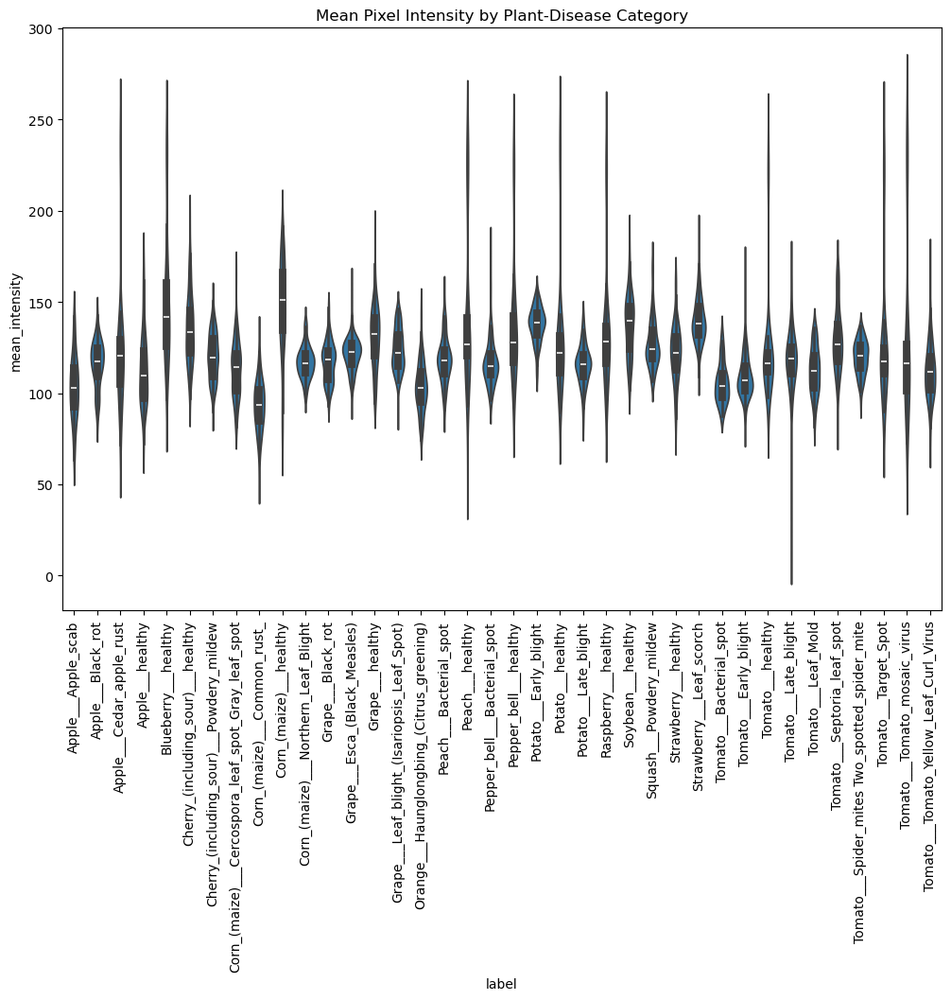

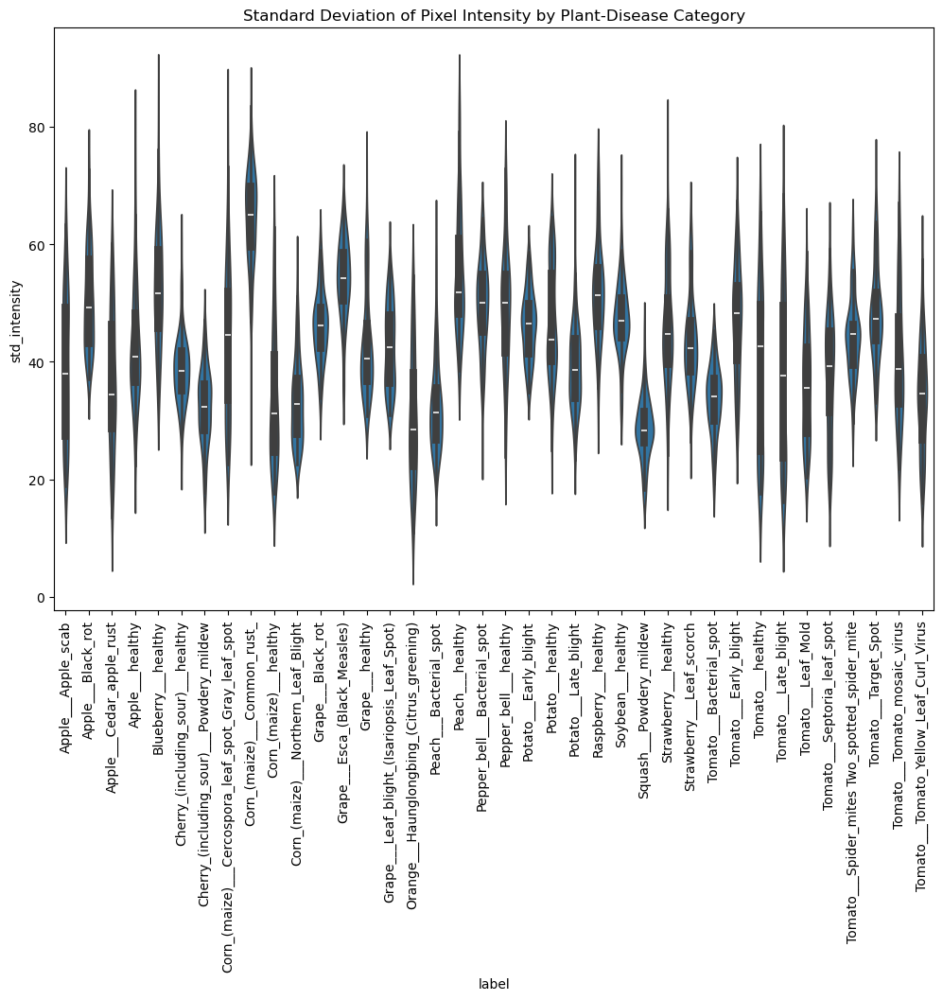

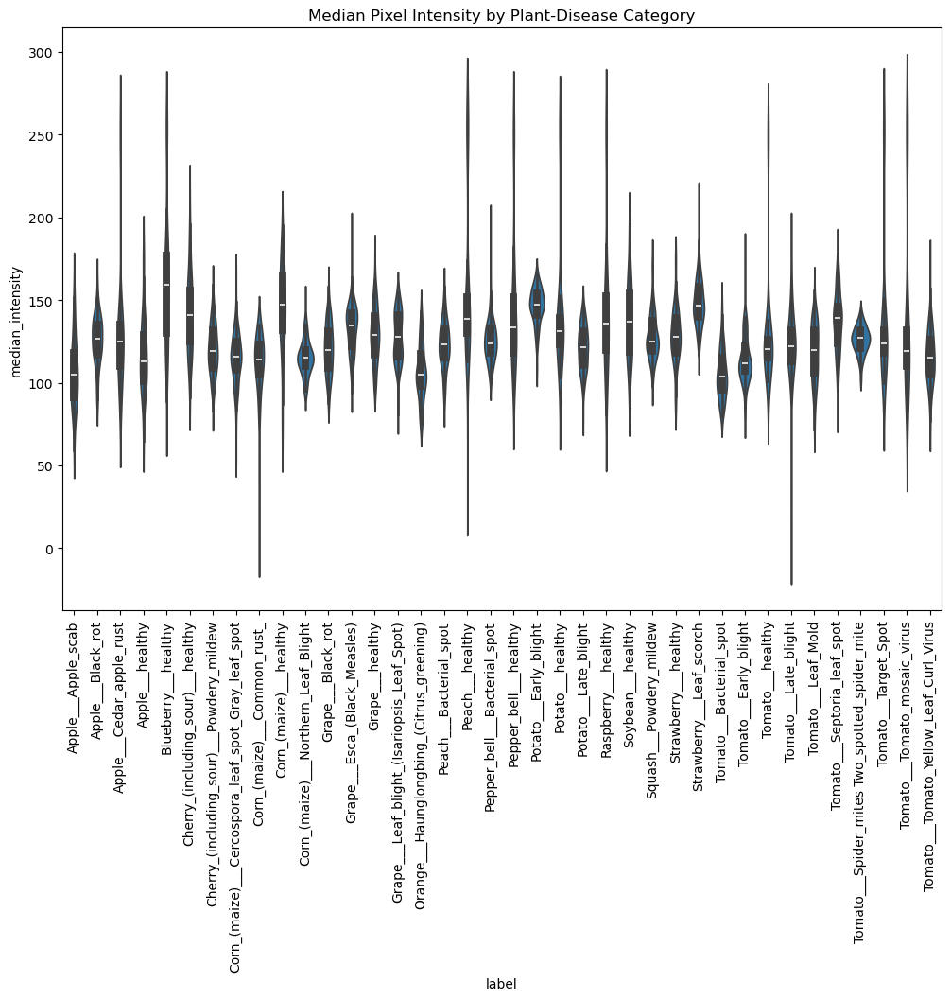

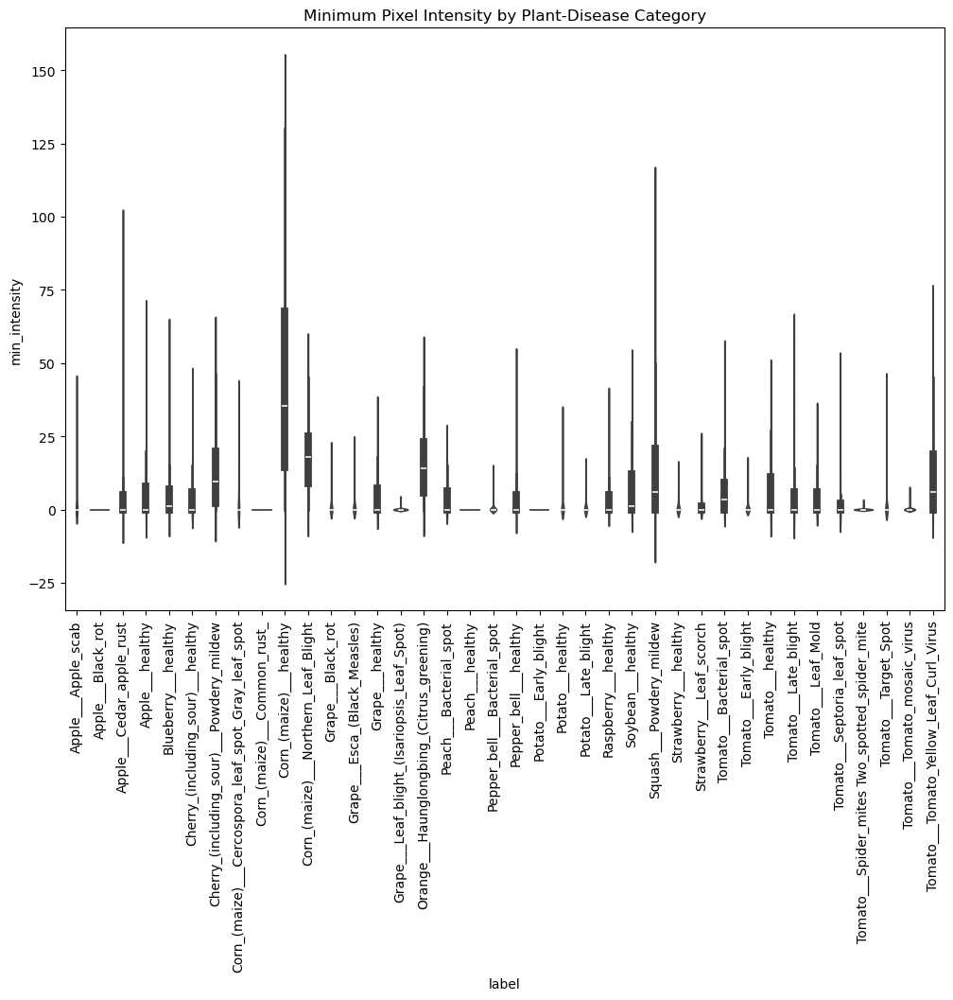

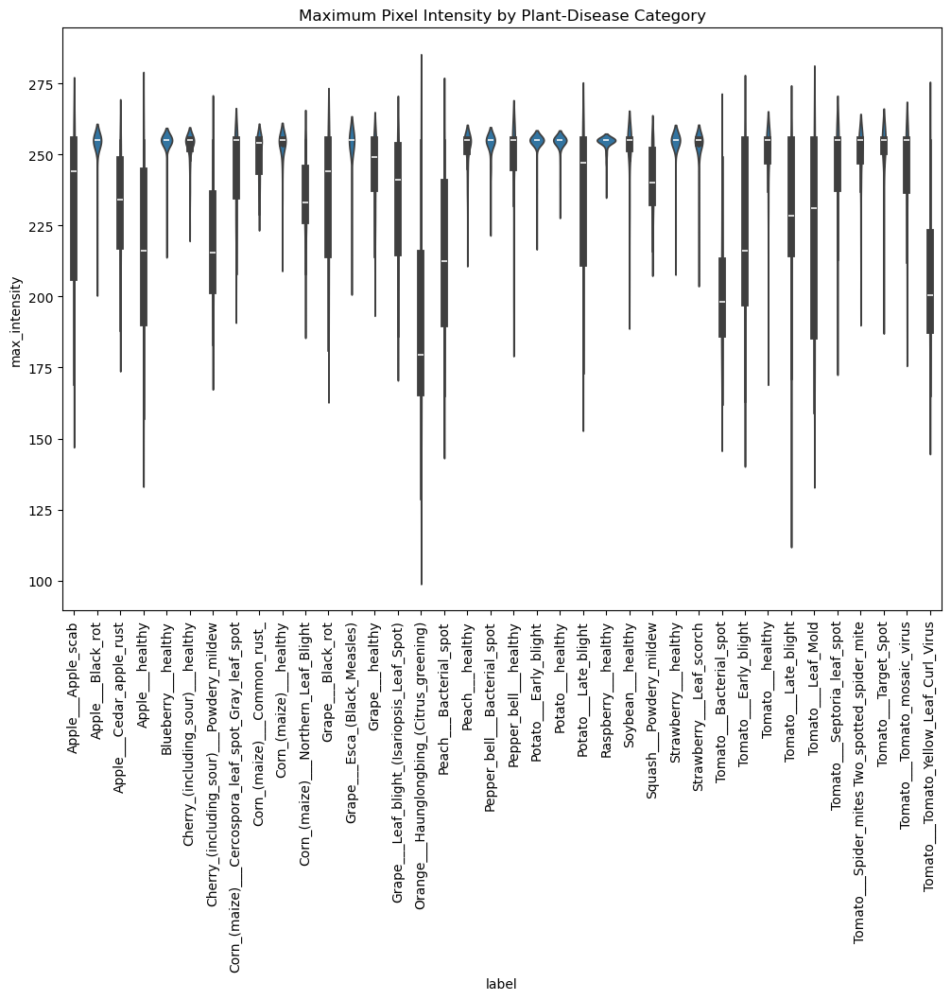

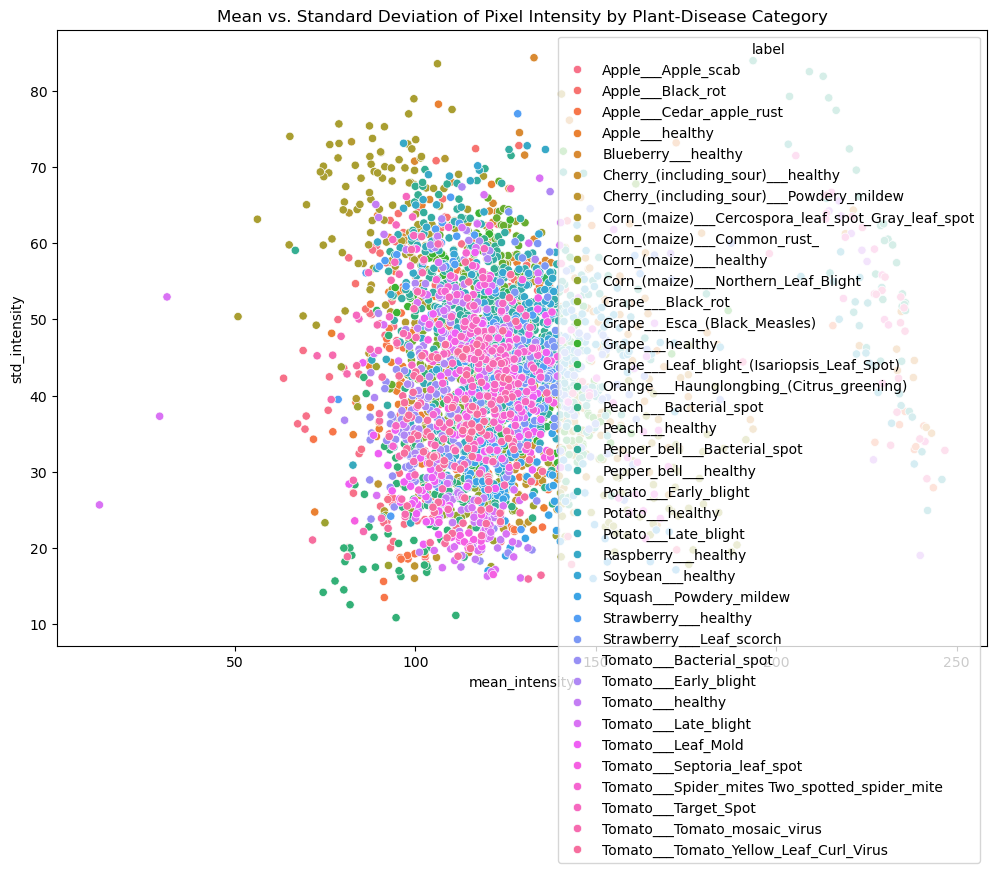

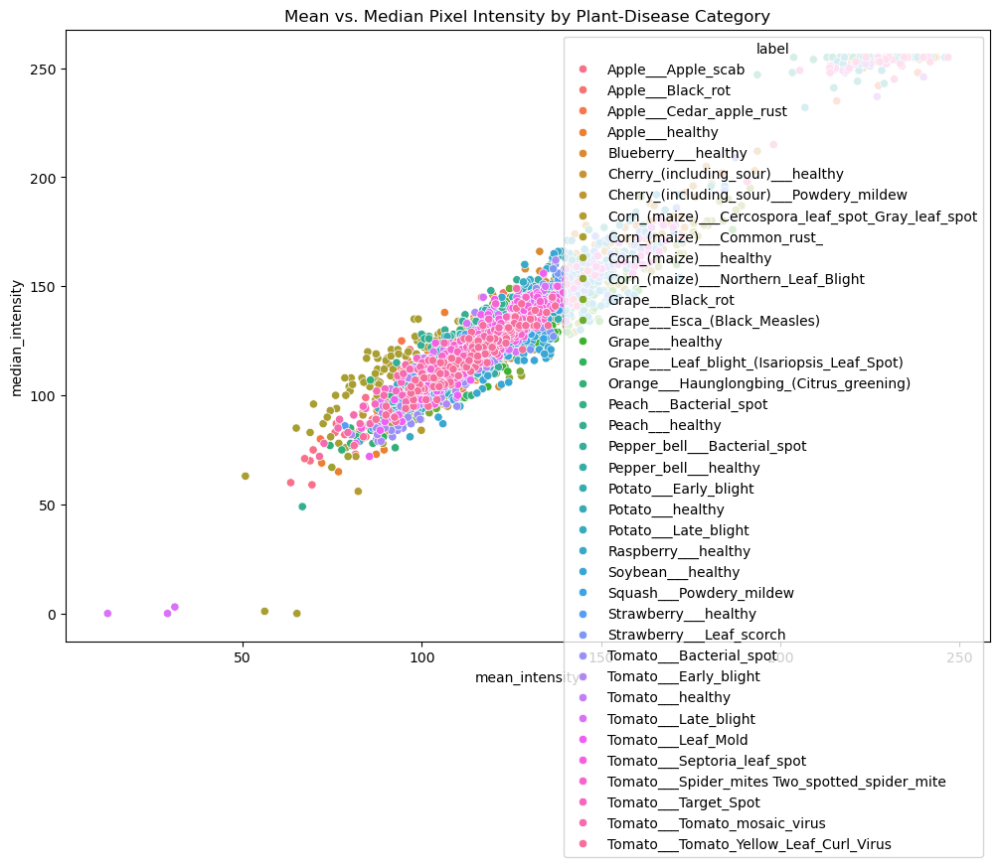

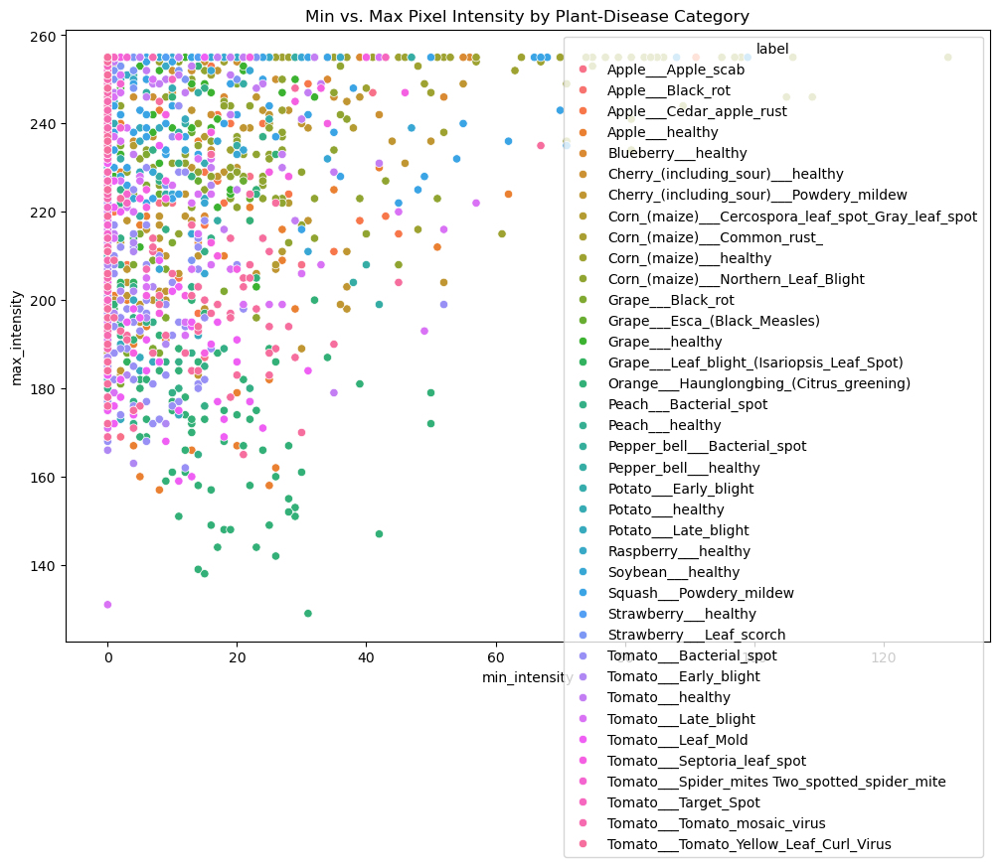

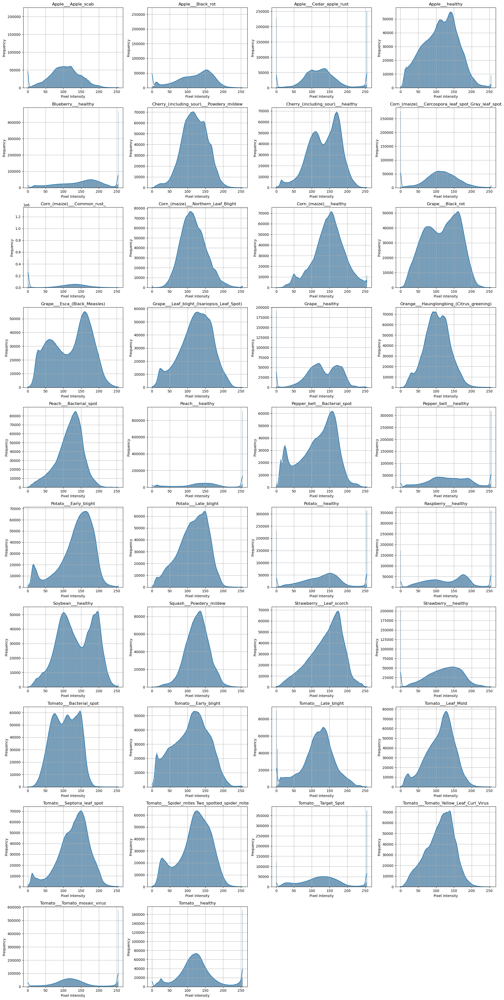

In [ ]:
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'

# Load images and labels using parallel processing
images, labels = load_images_from_folder(dataset_path)

# Calculate statistics
stats_df = calculate_statistics(images, labels)

# Plot violin plots
plot_violin(stats_df)

# Plot scatter plots
plot_scatter(stats_df)

# Show pixel distribution
show_pixel_distribution(images, labels)

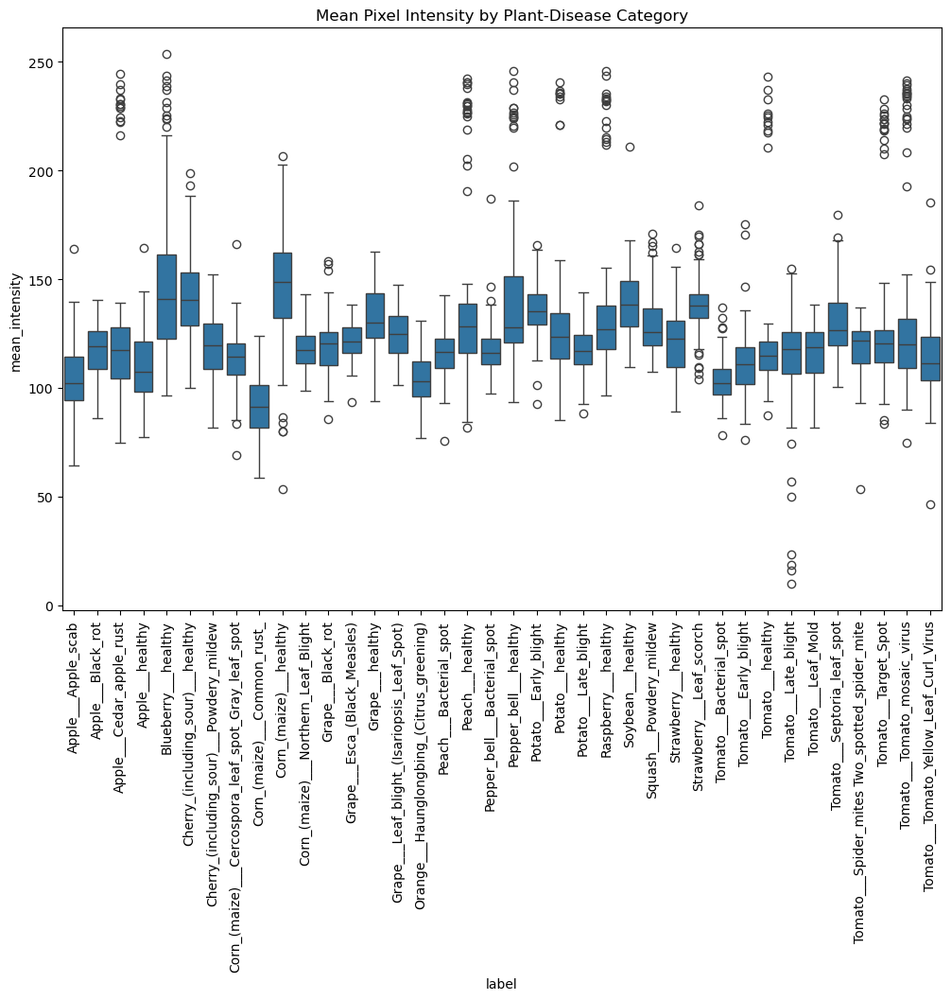

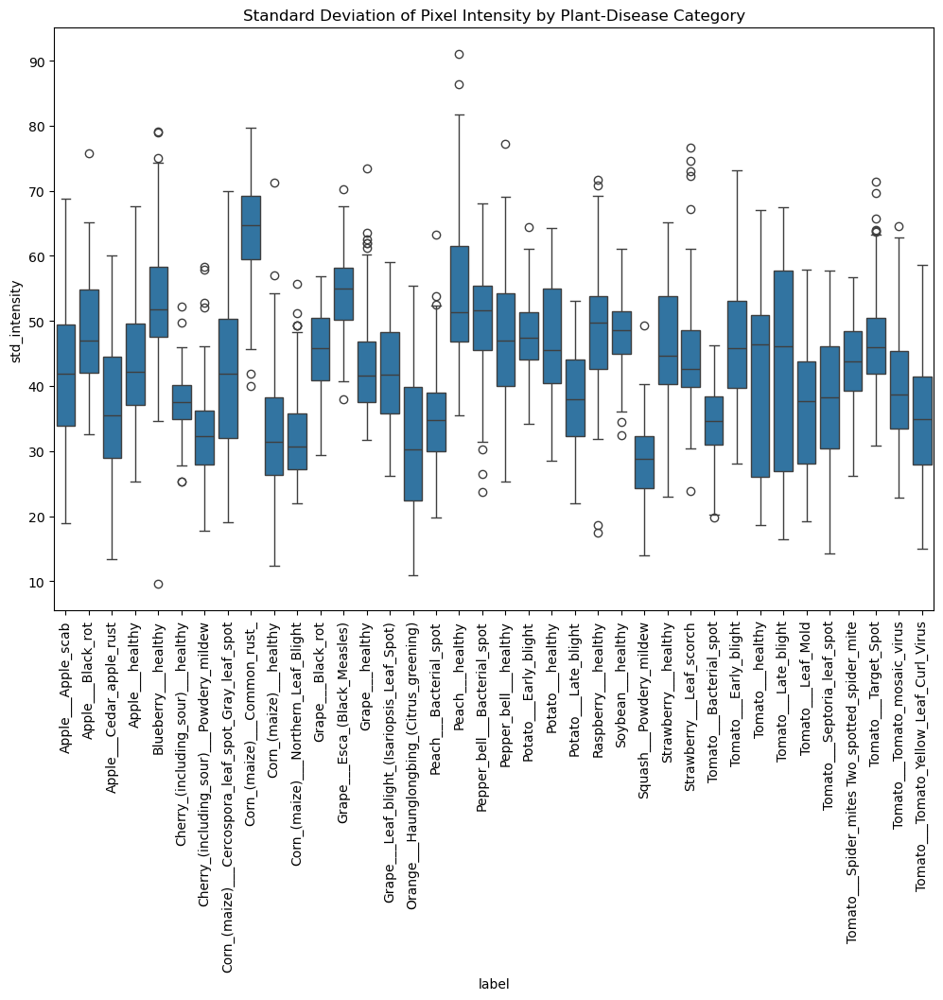

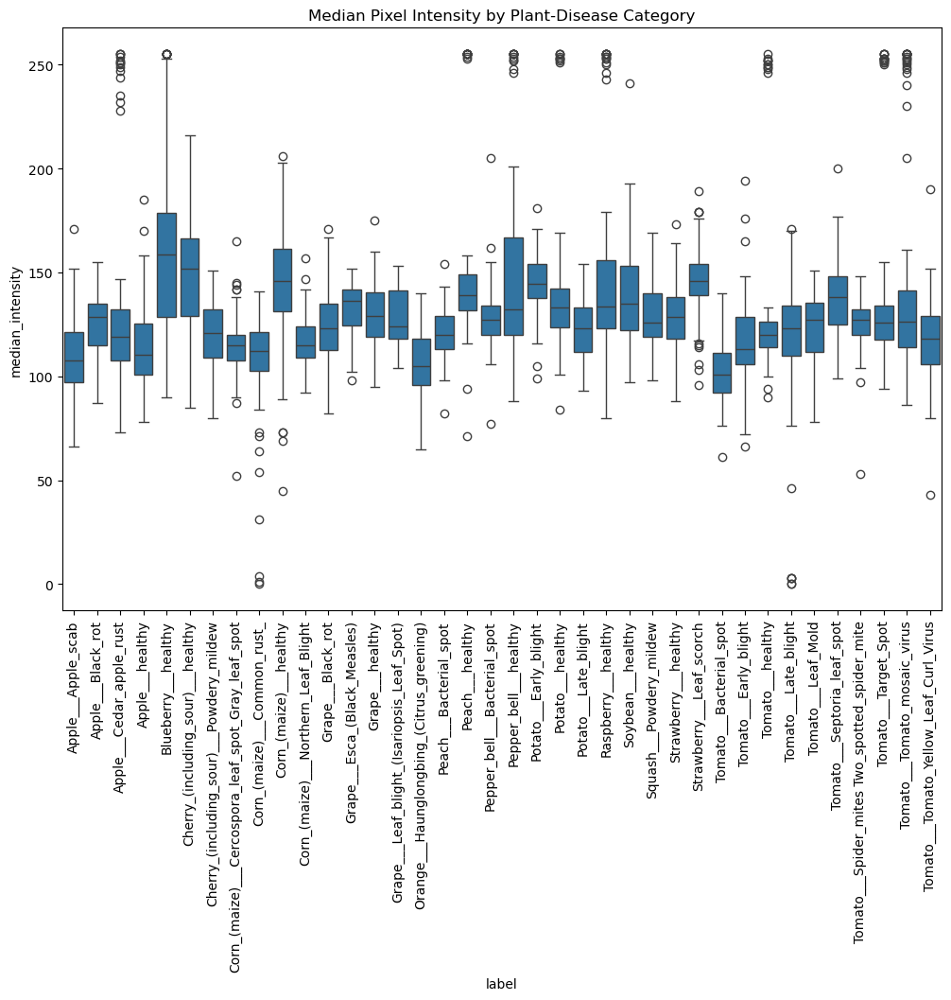

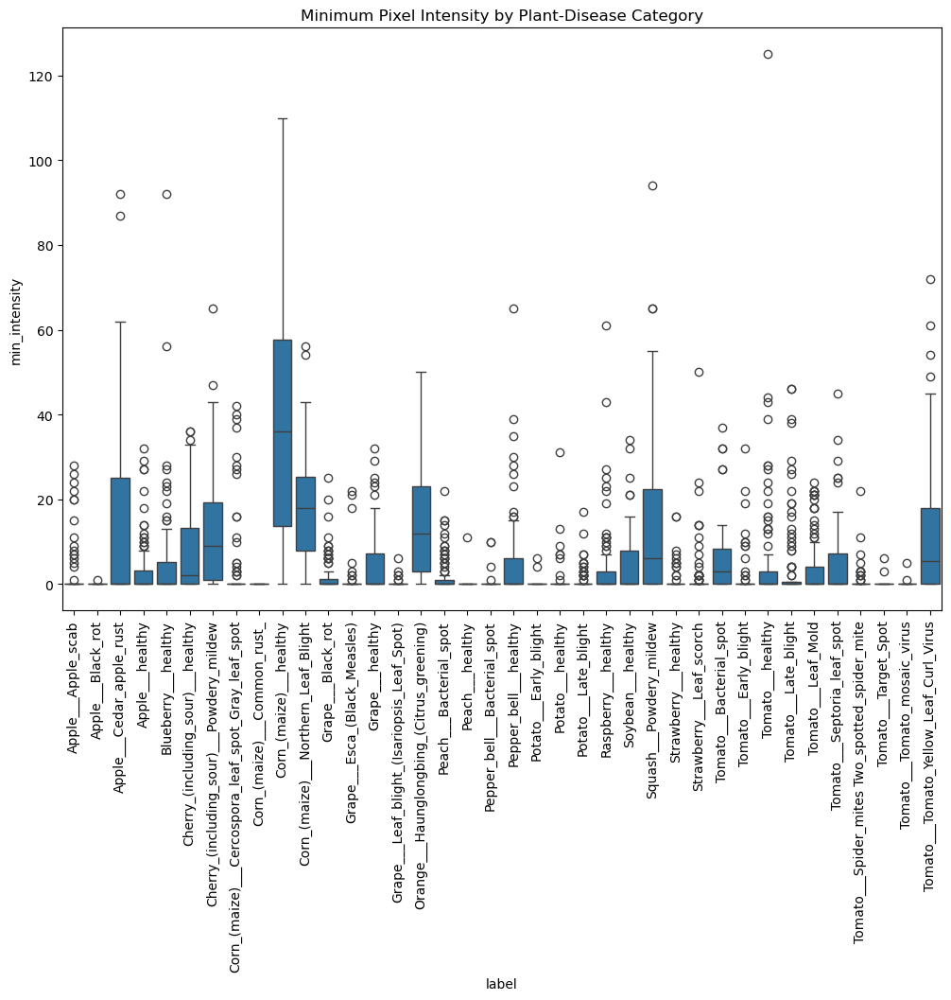

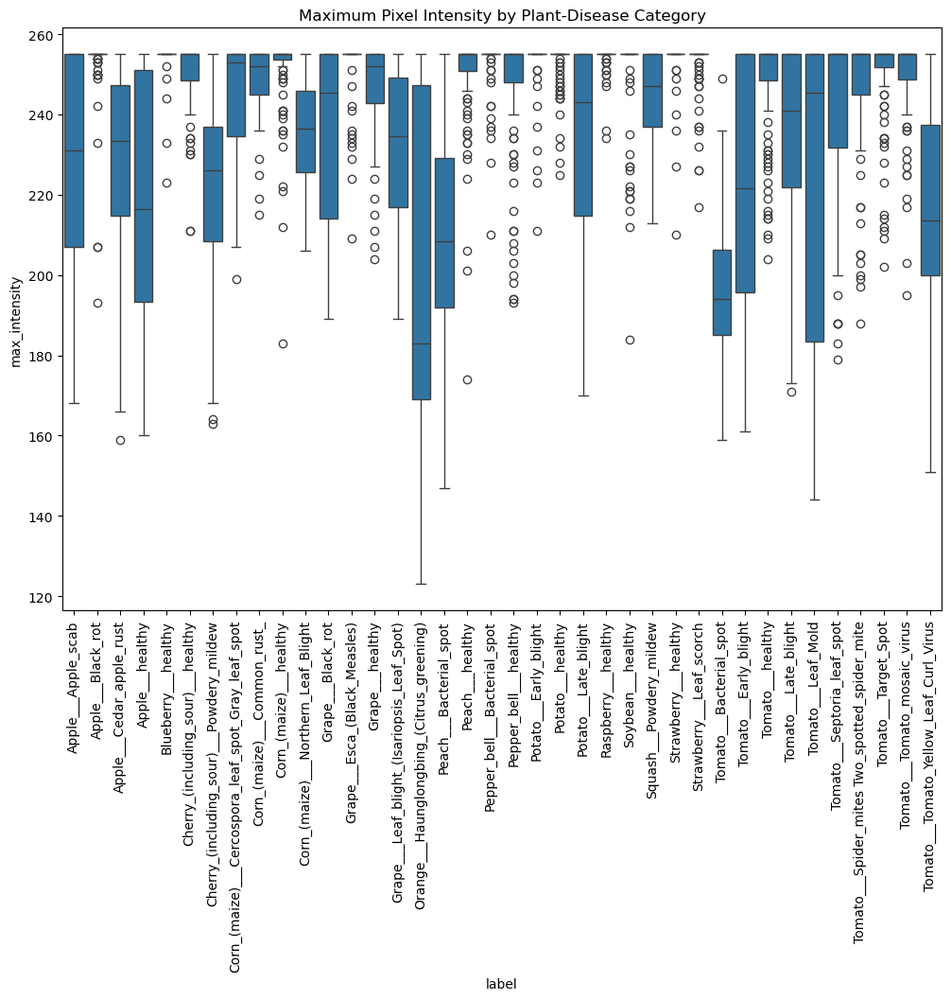

In [ ]:
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'

# Load images and labels
images, labels = load_images_from_folder(dataset_path)

# Calculate statistics
stats_df = calculate_statistics(images, labels)

# Visualize statistics
visualize_statistics(stats_df)

DataFrame to be plotted:
                label  mean_intensity  median_intensity  std_intensity  \
0  Apple___Apple_scab        0.446120          0.450237       0.057389   
1  Apple___Apple_scab        0.412736          0.447805       0.137310   
2  Apple___Apple_scab        0.501277          0.548072       0.190998   
3  Apple___Apple_scab        0.385845          0.421166       0.208223   
4  Apple___Apple_scab        0.512194          0.540403       0.161753   

   min_intensity  max_intensity  
0       0.168980       0.854791  
1       0.000000       0.801637  
2       0.000000       1.000000  
3       0.031247       0.995890  
4       0.000000       0.998753  


<Figure size 1200x800 with 0 Axes>

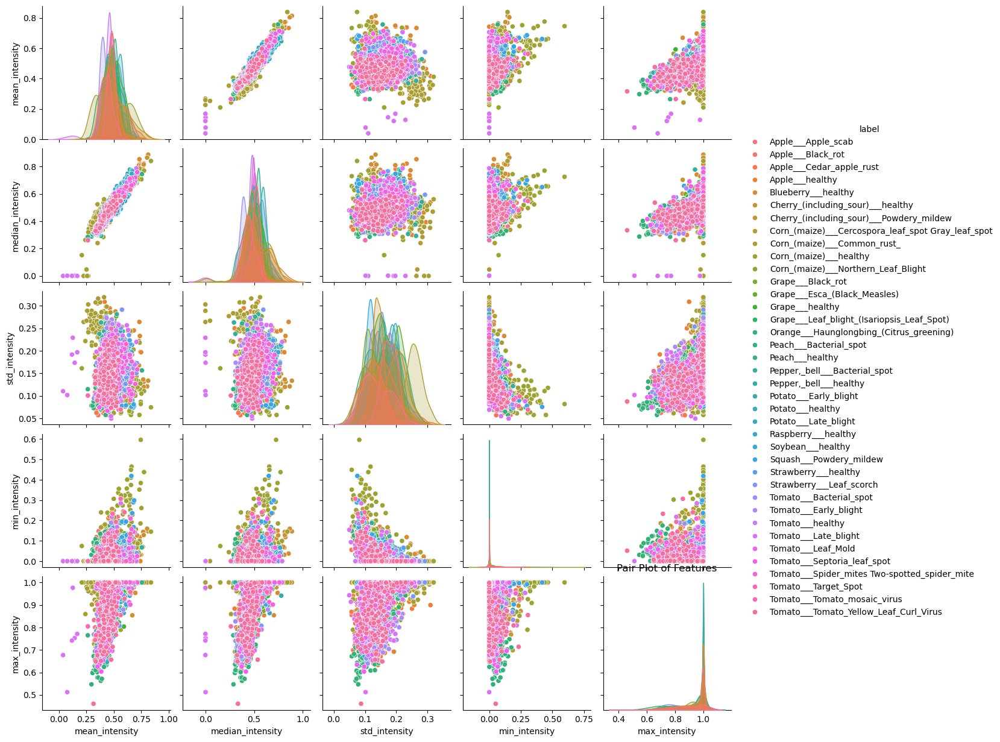

In [163]:
#dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/color'

# Load images and labels
images, labels = load_images_from_folder(dataset_path)

# Calculate statistics
stats_df = calculate_statistics(images, labels)

# Visualize pair_plot
plot_pairplot(stats_df, hue='label')

Number of images loaded: 3800
DataFrame to be plotted:
                label  mean_intensity  median_intensity  std_intensity  \
0  Apple___Apple_scab        0.412834          0.429186       0.191525   
1  Apple___Apple_scab        0.491542          0.541807       0.188472   
2  Apple___Apple_scab        0.344189          0.339137       0.071179   
3  Apple___Apple_scab        0.362239          0.327201       0.122998   
4  Apple___Apple_scab        0.384296          0.382506       0.116589   

   min_intensity  max_intensity health_status  
0       0.000000       0.998753      diseased  
1       0.000000       1.000000      diseased  
2       0.086648       0.716506      diseased  
3       0.084102       0.856181      diseased  
4       0.019812       0.787872      diseased  


<Figure size 1200x800 with 0 Axes>

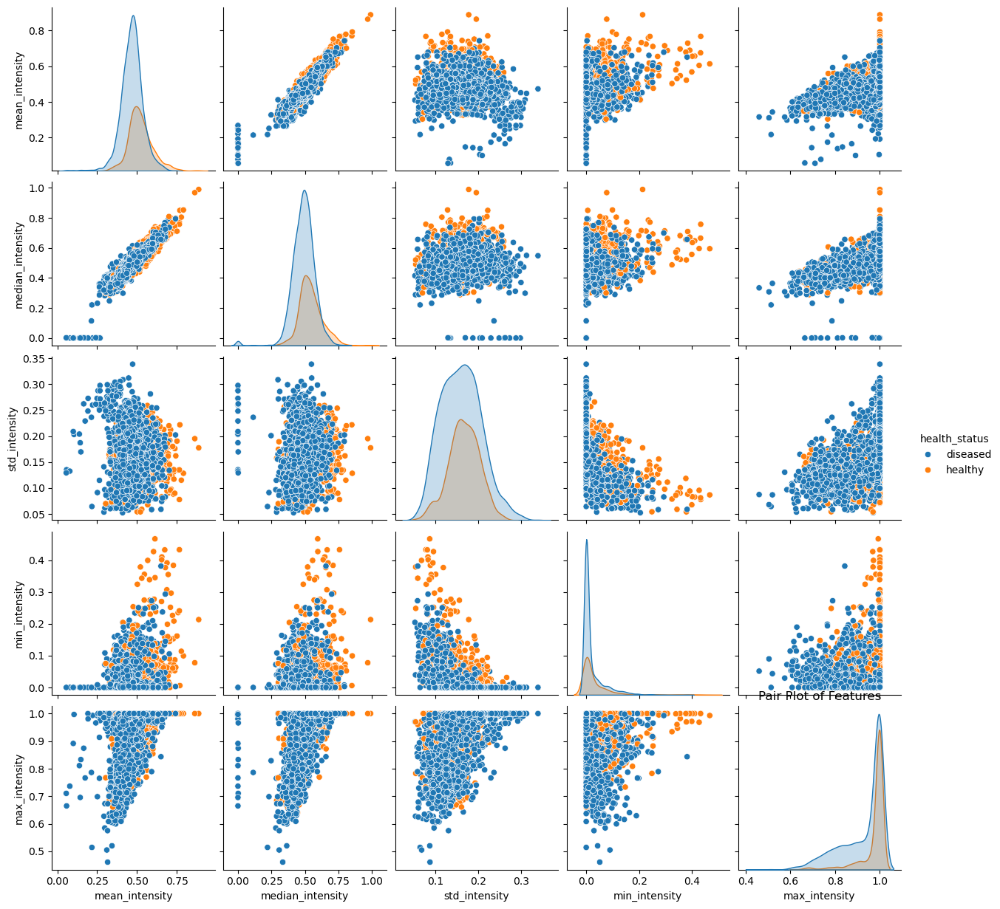

In [158]:
#dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/color'
# Load images and labels
images, labels = load_images_from_folder(dataset_path)

# Check number of images loaded
print(f"Number of images loaded: {len(images)}")

# Calculate statistics
stats_df = calculate_statistics(images, labels)

# Aggregate classes
stats_df = aggregate_classes(stats_df)

# Visualize pair_plot
plot_pairplot(stats_df, hue='health_status')

Number of images loaded: 3800
DataFrame to be plotted:
                label  mean_intensity  median_intensity  std_intensity  \
0  Apple___Apple_scab        0.178329          0.000000       0.231182   
1  Apple___Apple_scab        0.135034          0.000092       0.150880   
2  Apple___Apple_scab        0.239527          0.260737       0.255409   
3  Apple___Apple_scab        0.173502          0.157536       0.189298   
4  Apple___Apple_scab        0.259378          0.313627       0.251633   

   min_intensity  max_intensity species  
0            0.0       0.936806   Apple  
1            0.0       0.956131   Apple  
2            0.0       0.981140   Apple  
3            0.0       0.991329   Apple  
4            0.0       0.910542   Apple  


<Figure size 1200x800 with 0 Axes>

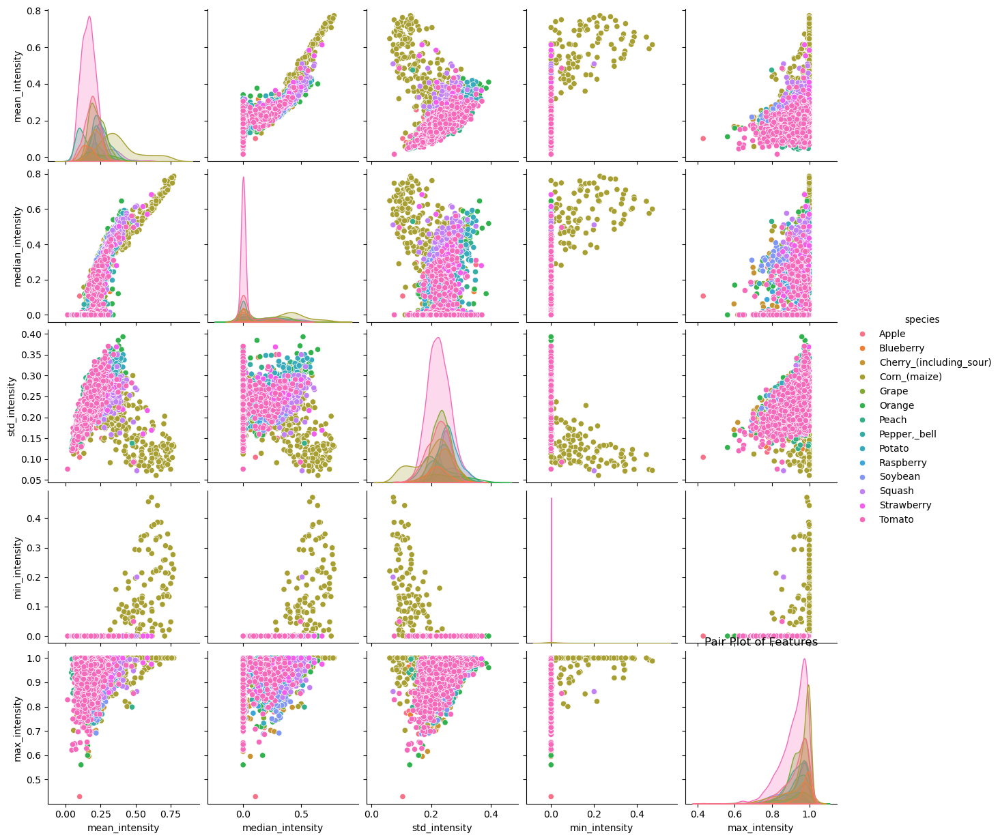

In [161]:
#dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/segmented'
# Load images and labels
images, labels = load_images_from_folder(dataset_path)

# Check number of images loaded
print(f"Number of images loaded: {len(images)}")

# Calculate statistics
stats_df = calculate_statistics(images, labels)

# Extract species
stats_df = extract_species(stats_df)

# Visualize pair_plot
plot_pairplot(stats_df, hue='species')

In [ ]:
# Path to the parent directory (update this to your specific path)
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'

# Get the file counts
file_counts = count_files_in_subdirectories(dataset_path)

# Display the results
file_counts_df = pd.DataFrame(list(file_counts.items()), columns=['Directory', 'File Count'])
file_counts_df

,Directory,File Count
0,Apple___Apple_scab,2016
1,Apple___Black_rot,1987
2,Apple___Cedar_apple_rust,1760
3,Apple___healthy,2008
4,Blueberry___healthy,1816
5,Cherry_(including_sour)___healthy,1826
6,Cherry_(including_sour)___Powdery_mildew,1683
7,Corn_(maize)___Cercospora_leaf_spot_Gray_leaf_...,1642
8,Corn_(maize)___Common_rust_,1907
9,Corn_(maize)___healthy,1859


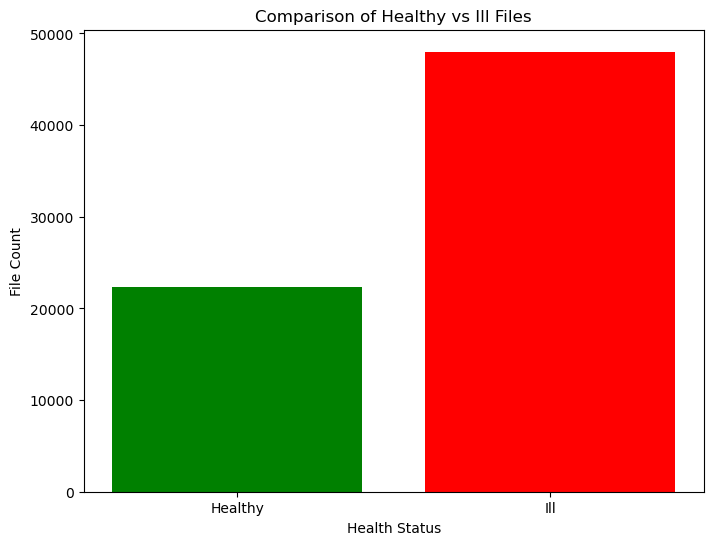

In [ ]:
# Path to the parent directory (update this to your specific path)
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'

# Get the file counts
file_counts = count_files_in_subdirectories(dataset_path)

# Convert to DataFrame
file_counts_df = pd.DataFrame(list(file_counts.items()), columns=['Directory', 'File Count'])

# Separate healthy and ill counts
file_counts_df['Health Status'] = file_counts_df['Directory'].apply(lambda x: 'Healthy' if 'healthy' in x.lower() else 'Ill')

# Summarize the counts
summary_df = file_counts_df.groupby('Health Status')['File Count'].sum().reset_index()

# Plotting
plt.figure(figsize=(8, 6))
plt.bar(summary_df['Health Status'], summary_df['File Count'], color=['green', 'red'])
plt.xlabel('Health Status')
plt.ylabel('File Count')
plt.title('Comparison of Healthy vs Ill Files')
plt.show()

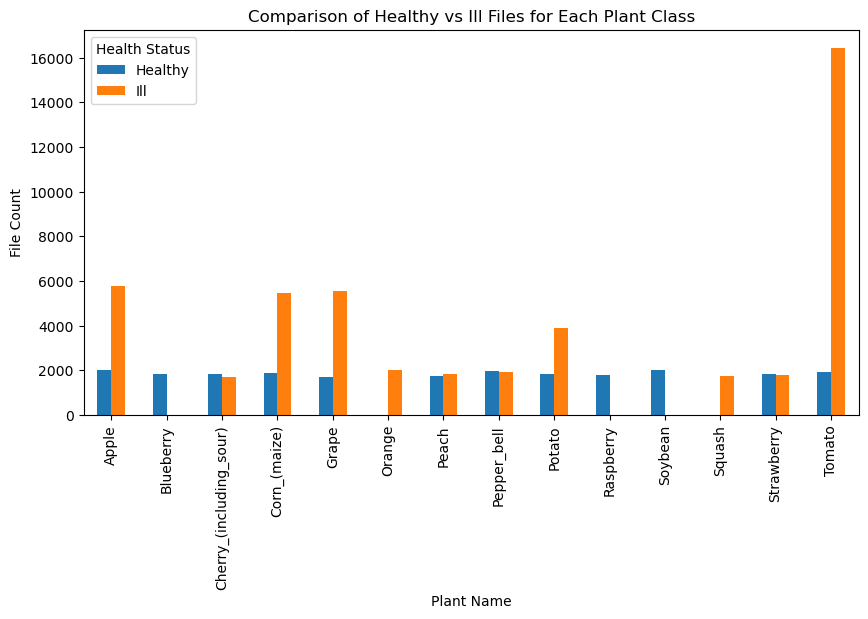

In [ ]:
# Path to the parent directory (update this to your specific path)
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'

# Get the file counts
file_counts = count_files_in_subdirectories(dataset_path)

# Convert to DataFrame
file_counts_df = pd.DataFrame(list(file_counts.items()), columns=['Directory', 'File Count'])

# Extract plant name and health status
file_counts_df['Plant Name'] = file_counts_df['Directory'].apply(lambda x: x.split('___')[0])
file_counts_df['Health Status'] = file_counts_df['Directory'].apply(lambda x: 'Healthy' if 'healthy' in x.lower() else 'Ill')

# Summarize the counts by plant name and health status
summary_df = file_counts_df.groupby(['Plant Name', 'Health Status'])['File Count'].sum().unstack().fillna(0)

# Plotting
summary_df.plot(kind='bar', stacked=False, figsize=(10, 5))
plt.xlabel('Plant Name')
plt.ylabel('File Count')
plt.title('Comparison of Healthy vs Ill Files for Each Plant Class')
plt.legend(title='Health Status')
plt.show()

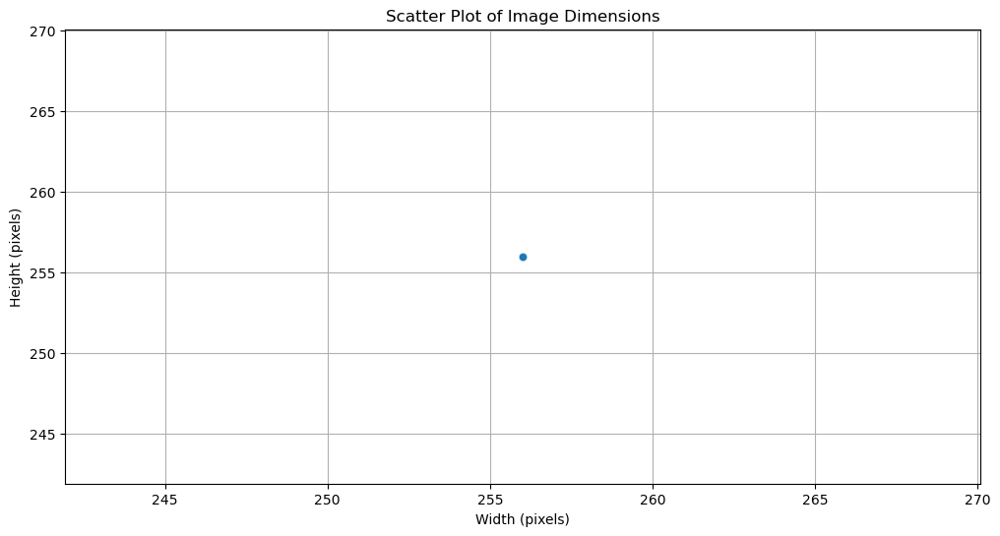

In [ ]:
dataset_path = 'C:/Users/kheir/Downloads/PlantRecognition/NewPlantDiseasesDataset/NewPlantDiseasesDatasetAugmented/NewPlantDiseasesDatasetAugmented/train'

# Load images, labels, and dimensions using parallel processing
images, labels, widths, heights = load_images_from_folder_dimension(dataset_path, sample_size=100, n_jobs=cpu_count())

# Plot image dimension distribution
plot_image_dimensions(widths, heights)